## **0. 루브릭**

| 평가문항 | 상세기준 |
| --- | --- |
| 1. CAM을 얻기 위한 기본모델의 구성과 학습이 정상 진행되었는가? | ResNet50 + GAP + DenseLayer 결합된 CAM 모델의 학습과정이 안정적으로 수렴하였다. |
| 2. 분류결과를 설명 가능한 Class activation map을 얻을 수 있는가? | CAM 방식과 Grad-CAM 방식의 class activation map이 정상적으로 얻어지며, 시각화하였을 때 해당 object의 주요 특징 위치를 잘 반영한다. |
| 3. 인식결과의 시각화 및 성능 분석을 적절히 수행하였는가? | CAM과 Grad-CAM 각각에 대해 원본이미지합성, 바운딩박스, IoU 계산 과정을 통해 CAM과 Grad-CAM의 object localization 성능이 비교분석되었다. |


## **1. 실험하기**

### **라이브러리 및 데이터셋 불러오기**

In [1]:
# 라이브러리 불러오기
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense
import tensorflow_datasets as tfds
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import copy
import cv2
import os
from PIL import Image

In [2]:
# GPU 있는지 확인하기
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [3]:
# google drive 마운트하기
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
# stanford dogs 데이터셋 불러오기
(ds_train, ds_test), ds_info = tfds.load(
    'stanford_dogs',
    split=['train', 'test'],
    shuffle_files=True,
    with_info=True,
)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/12000 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/stanford_dogs/incomplete.53FPM4_0.2.0/stanford_dogs-train.tfrecord*...:   …

Generating test examples...:   0%|          | 0/8580 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/stanford_dogs/incomplete.53FPM4_0.2.0/stanford_dogs-test.tfrecord*...:   0…

Dataset stanford_dogs downloaded and prepared to /root/tensorflow_datasets/stanford_dogs/0.2.0. Subsequent calls will reuse this data.


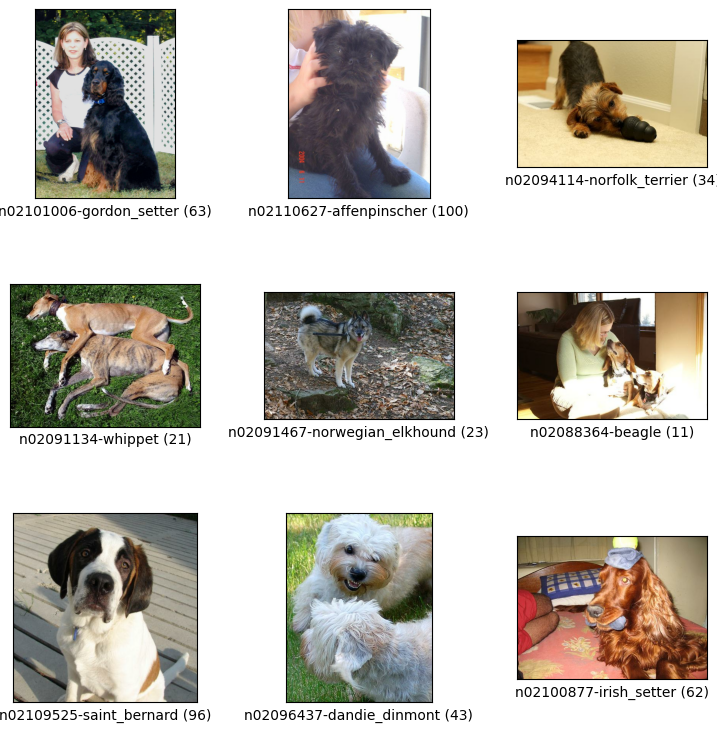

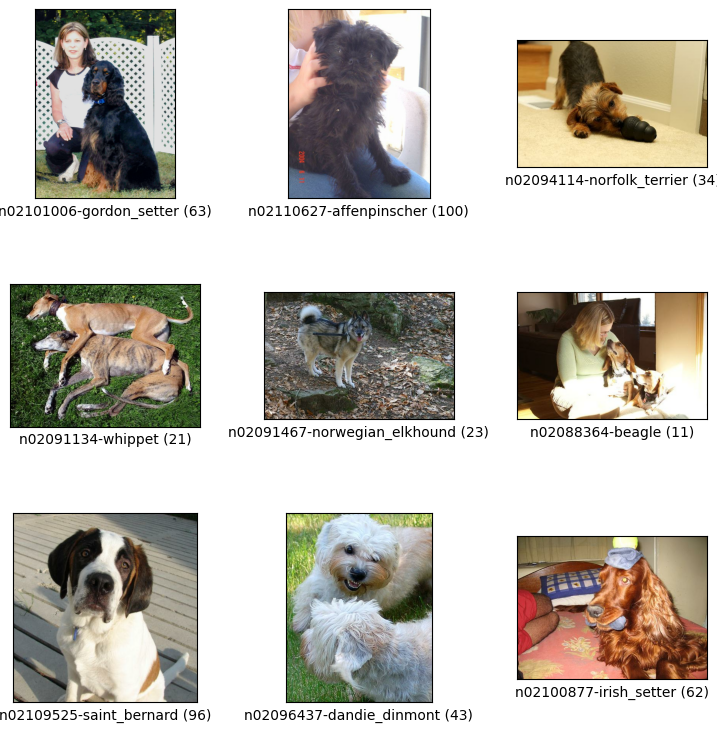

In [5]:
# 학습용 데이터셋 확인하기
tfds.show_examples(ds_train, ds_info)

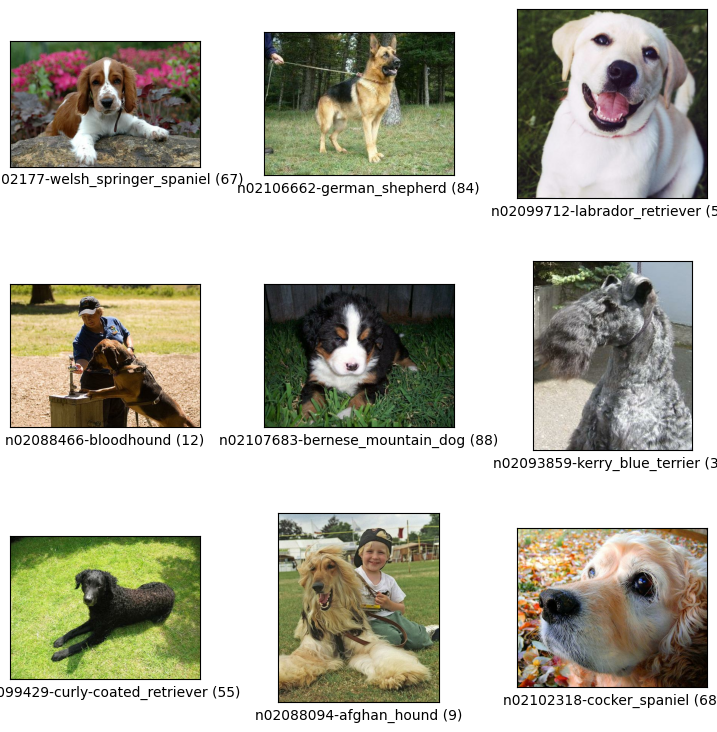

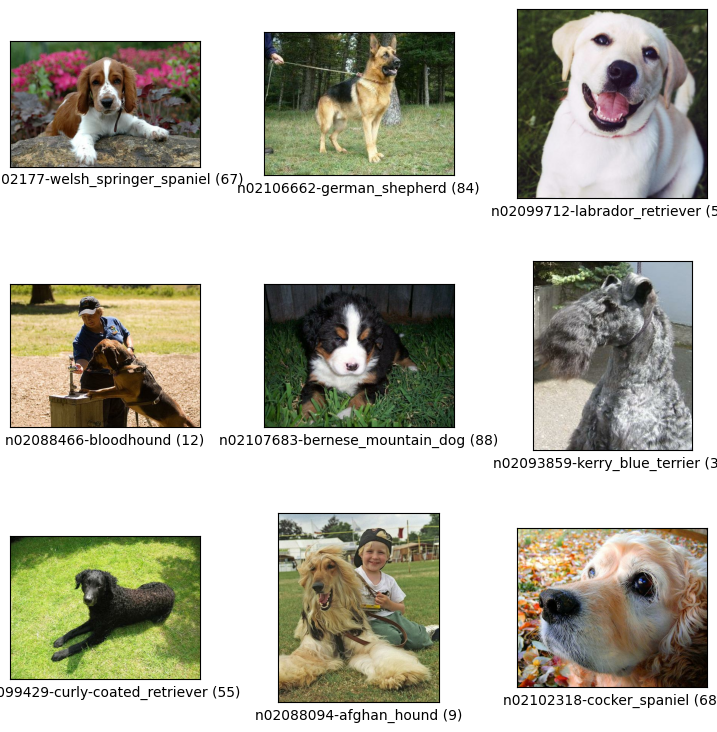

In [6]:
# 테스트용 데이터셋 확인하기
tfds.show_examples(ds_test, ds_info)

In [7]:
# feature가 어떻게 구성되어 있는지 확인하기
ds_info.features

FeaturesDict({
    'image': Image(shape=(None, None, 3), dtype=uint8),
    'image/filename': Text(shape=(), dtype=string),
    'label': ClassLabel(shape=(), dtype=int64, num_classes=120),
    'objects': Sequence({
        'bbox': BBoxFeature(shape=(4,), dtype=float32),
    }),
})

In [8]:
# 클래스의 개수 확인하기
num_classes = ds_info.features["label"].num_classes
num_classes

120

In [9]:
# base 모델 구현하기
# ResNet50 모델 활용하기
base_model = keras.applications.resnet50.ResNet50(
    include_top=False,    # Imagenet 분류기  fully connected layer 제거
    weights='imagenet',
    input_shape=(224, 224, 3),
    # 마지막 fully connected layer 대신
    # GAP을 사용해야 함
    pooling='avg',      # GAP를 적용
)
x = base_model.output
preds = Dense(num_classes, activation='softmax')(x)
cam_model = keras.Model(inputs=base_model.input, outputs=preds)

94765736/94765736 [==============================] - 0s 0us/step


In [10]:
# CAM 모델 만들기
cam_model = keras.Model(inputs=base_model.input, outputs=preds)

In [11]:
# CAM 모델 요약하기
cam_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                        

In [12]:
# 기본적인 전처리 함수 정의하기
def normalize_and_resize_img(input):
    # Normalizes images: `uint8` -> `float32`
    image = tf.image.resize(input['image'], [224, 224])
    input['image'] = tf.cast(image, tf.float32) / 255.
    return input['image'], input['label']

In [13]:
# 데이터셋을 배치처리를 적용한 함수 구현하기
def apply_normalize_on_dataset(ds, is_test=False, batch_size=16):
    ds = ds.map(
        normalize_and_resize_img,
        num_parallel_calls=2
    )
    ds = ds.batch(batch_size)
    ds = ds.prefetch(tf.data.experimental.AUTOTUNE)
    return ds

In [14]:
# 데이터셋에 전처리와 배치처리를 적용합니다.
ds_train_norm = apply_normalize_on_dataset(ds_train)
ds_val_norm = apply_normalize_on_dataset(ds_test)

In [15]:
# 구성된 배치의 모양을 확인해 봅니다.
for input in ds_train_norm.take(1):
    image, label = input
    print(image.shape)
    print(label.shape)

(16, 224, 224, 3)
(16,)


In [16]:
# 학습 횟수 설정하기
EPOCHS = 30

In [17]:
# 모델 컴파일하기
cam_model.compile(
    loss='sparse_categorical_crossentropy',
    optimizer=tf.keras.optimizers.SGD(learning_rate=0.01),
    metrics=['accuracy'],
)

"\ncam_model.compile(\n    loss='sparse_categorical_crossentropy',\n    optimizer=tf.keras.optimizers.SGD(learning_rate=0.01),\n    metrics=['accuracy'],\n)\n"

In [18]:
# 모델 학습시키기
history_cam_model = cam_model.fit(
    ds_train_norm,
    steps_per_epoch=int(ds_info.splits['train'].num_examples/16),
    validation_steps=int(ds_info.splits['test'].num_examples/16),
    epochs=EPOCHS,
    validation_data=ds_val_norm,
    verbose=1,
    use_multiprocessing=True,
)

"\nhistory_cam_model = cam_model.fit(\n    ds_train_norm,\n    steps_per_epoch=int(ds_info.splits['train'].num_examples/16),\n    validation_steps=int(ds_info.splits['test'].num_examples/16),\n    epochs=EPOCHS,\n    validation_data=ds_val_norm,\n    verbose=1,\n    use_multiprocessing=True,\n)\n"

In [19]:
# 모델 저장 경로 설정하기

cam_model_path = '/content/drive/MyDrive/07. GoData/10. cam_model/cam_model2.h5'

# 모델 저장하기
cam_model.save(cam_model_path)

"\ncam_model_path = '/content/drive/MyDrive/07. GoData/10. cam_model/cam_model2.h5'\n\n# 모델 저장하기\ncam_model.save(cam_model_path)\n"

### **CAM 구현하기**

In [20]:
# 데이터셋에서 한 장씩 뽑기
def get_one(ds):
    ds = ds.take(1)
    sample_data = list(ds.as_numpy_iterator())
    bbox = sample_data[0]['objects']['bbox']
    image = sample_data[0]['image']
    label = sample_data[0]['label']
    return sample_data[0]

67


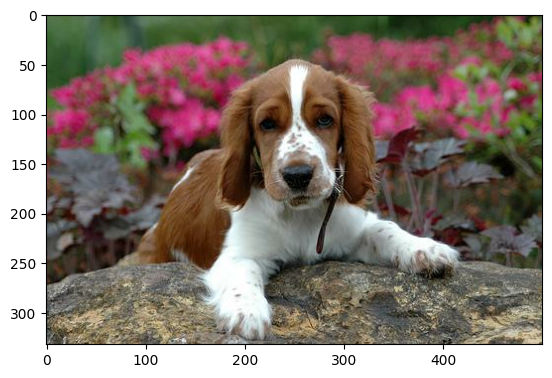

In [21]:
# 결과물 확인해보기
item = get_one(ds_test)
print(item['label'])
plt.imshow(item['image'])
plt.show()

In [22]:
# 미리 학습한 모델 불러오기
cam_model_path = '/content/drive/MyDrive/07. GoData/10. cam_model/cam_model2.h5'

# CAM 모델 불러오기
cam_model = tf.keras.models.load_model(cam_model_path)

1. CAM(Class Activation Map)을 직접 구현해봅시다.

In [23]:
# cam 모델 생성하는 함수
def generate_cam(model, item):
    item = copy.deepcopy(item)
    width = item['image'].shape[1]
    height = item['image'].shape[0]

    img_tensor, class_idx = normalize_and_resize_img(item)

    # 학습한 모델에서 원하는 Layer의 output을 얻기 위해서
    # 모델의 input과 output을 새롭게 정의해주기
    cam_model = tf.keras.models.Model([model.inputs], [model.layers[-3].output, model.output])
    conv_outputs, predictions = cam_model(tf.expand_dims(img_tensor, 0))
    conv_outputs = conv_outputs[0, :, :, :]

    # 모델의 weight activation은 마지막 layer에 있음.
    class_weights = model.layers[-1].get_weights()[0]

    cam_image = np.zeros(dtype=np.float32, shape=conv_outputs.shape[0:2])
    for i, w in enumerate(class_weights[:, class_idx]):
        # conv_outputs의 i번째 채널과 i번째 weight를 곱해서 누적하면
        # 활성화된 정도가 나타날 것임
        cam_image += w * conv_outputs[:, :, i]

    cam_image /= np.max(cam_image) # activation score를 normalize하기
    cam_image = cam_image.numpy()
    # 원래 이미지의 크기로 resize하기
    cam_image = cv2.resize(cam_image, (width, height))
    return cam_image

2. 만든 함수로 CAM 이미지를 생성합니다.

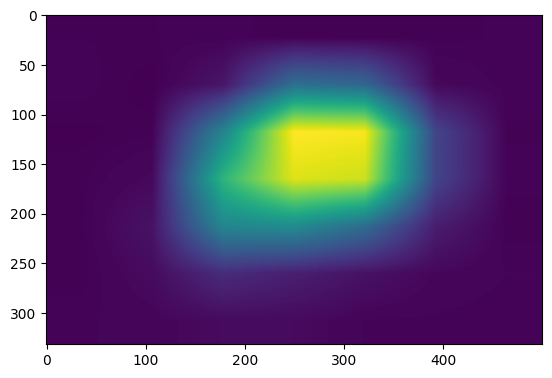

In [24]:
# CAM 이미지 생성하기
cam_image = generate_cam(cam_model, item)
plt.imshow(cam_image)
plt.show()

3. 원본 이미지와 CAM 이미지를 입력으로 받고 두 개의 이미지의 투명도를 조정, 하나의 이미지에서 원본과 CAM을 겹쳐 보여주는 `visualize_cam_on_image` 함수를 만들어봅시다.

In [25]:
# 두 개의 이미지의 투명도를 조정해서
# 하나의 이미지에서 원본과 CAM을 겹쳐 보여주는 함수 구현하기
def visualize_cam_on_image(src1, src2, alpha=0.5):
    beta = (1.0 - alpha)
    merged_image = cv2.addWeighted(src1, alpha, src2, beta, 0.0)
    return merged_image

In [26]:
origin_image = item['image'].astype(np.uint8)

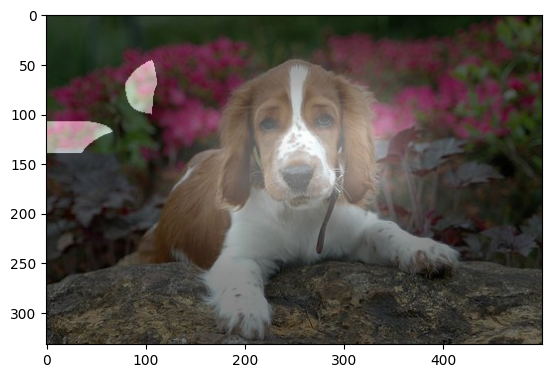

In [27]:
cam_image_3channel = np.stack([cam_image*255]*3, axis=-1).astype(np.uint8)
blended_image = visualize_cam_on_image(cam_image_3channel, origin_image)
plt.imshow(blended_image)

### **Grad-CAM 구현하기**

40


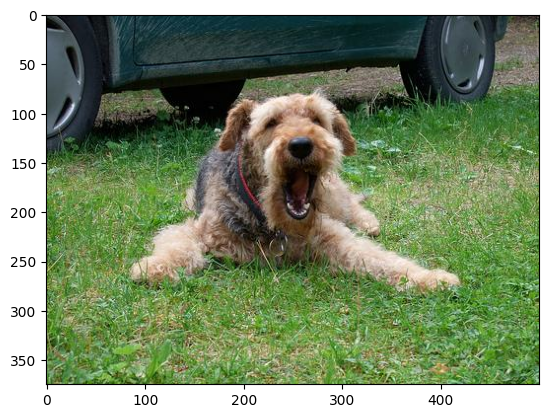

In [28]:
# 새로운 이미지 뽑기
item = get_one(ds_test)
print(item['label'])
plt.imshow(item['image'])
plt.show()

1. Grad-CAM을 직접 구현해봅시다.

In [29]:
# Grad-CAM 생성 함수 구현하기
def generate_grad_cam(model, activation_layer, item):
    item = copy.deepcopy(item)
    width = item['image'].shape[1]
    height = item['image'].shape[0]
    img_tensor, class_idx = normalize_and_resize_img(item)

    # Grad cam에서도 cam과 같이 특정 레이어의 output을 필요로 하므로
    # 모델의 input과 output을 새롭게 정의하기
    # 이때 원하는 레이어가 다를 수 있으니
    # 해당 레이어의 이름으로 찾은 후 output으로 추가하기
    grad_model = tf.keras.models.Model([model.inputs],
     [model.get_layer(activation_layer).output, model.output])

    # Gradient를 얻기 위해 tape를 사용하기
    with tf.GradientTape() as tape:
        conv_output, pred = grad_model(tf.expand_dims(img_tensor, 0))

        # 원하는 class(여기서는 정답으로 활용) 예측값을 얻기
        loss = pred[:, class_idx]
        output = conv_output[0] # 원하는 layer의 output을 얻기
        # 예측값에 따른 Layer의 gradient를 얻기
        grad_val = tape.gradient(loss, conv_output)[0]

    # gradient의 GAP으로 weight를 구하기
    weights = np.mean(grad_val, axis=(0, 1))
    grad_cam_image = np.zeros(dtype=np.float32, shape=conv_output.shape[0:2])
    for k, w in enumerate(weights):
        # output의 k번째 채널과 k번째 weight를 곱하고 누적해서
        # class activation map을 얻기
        grad_cam_image += w * output[:, :, k]

    grad_cam_image = tf.math.maximum(0, grad_cam_image)
    grad_cam_image /= np.max(grad_cam_image)
    grad_cam_image = grad_cam_image.numpy()
    grad_cam_image = cv2.resize(grad_cam_image, (width, height))
    return grad_cam_image

2. 만든 함수로 여러 레이어의 CAM 이미지를 뽑아서 직접 확인해 봅시다.

* conv5_out (비교 대상 레이어)

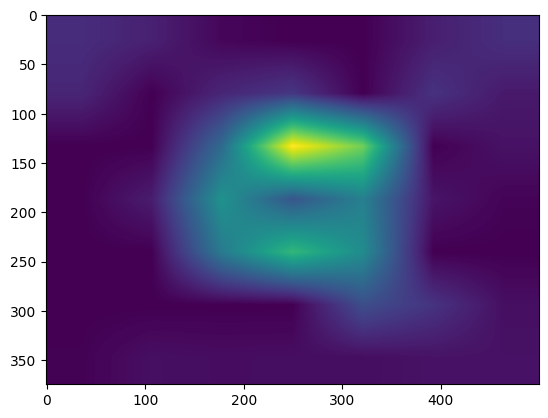

In [30]:
# 이미지에 CAM 함수 적용하기(conv5_block1_out 적용)
cam_image_conv5_block1_out = generate_grad_cam(cam_model, 'conv5_block1_out', item)
plt.imshow(cam_image_conv5_block1_out)
plt.show()

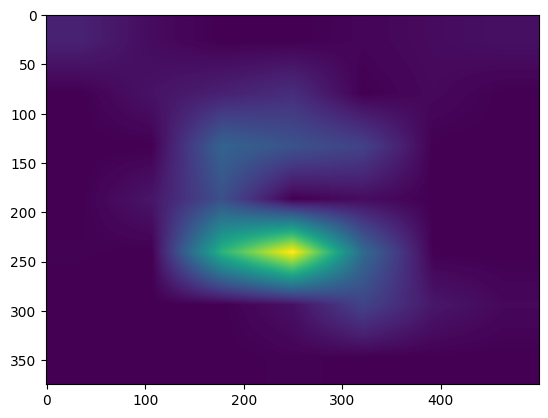

In [31]:
# 이미지에 CAM 함수 적용하기(conv5_block2_out 적용)
cam_image_conv5_block2_out = generate_grad_cam(cam_model, 'conv5_block2_out', item)
plt.imshow(cam_image_conv5_block2_out)
plt.show()

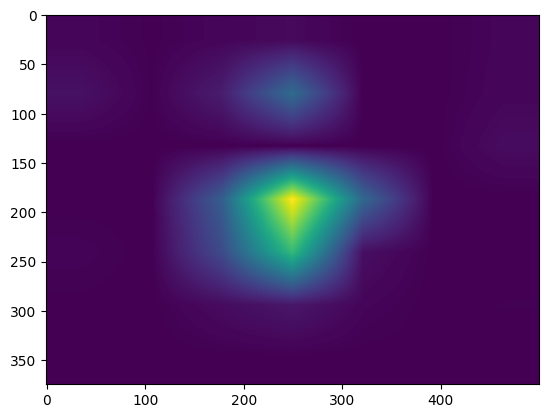

In [32]:
# 이미지에 CAM 함수 적용하기(conv5_block3_out 적용)
cam_image_conv5_block3_out = generate_grad_cam(cam_model, 'conv5_block3_out', item)
plt.imshow(cam_image_conv5_block3_out)
plt.show()

* conv4_out 레이어

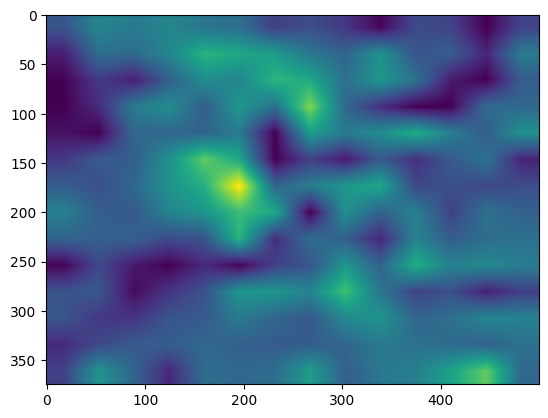

In [33]:
# 이미지에 CAM 함수 적용하기(conv4_block1_out 적용)
cam_image_conv4_block1_out = generate_grad_cam(cam_model, 'conv4_block1_out', item)
plt.imshow(cam_image_conv4_block1_out)
plt.show()

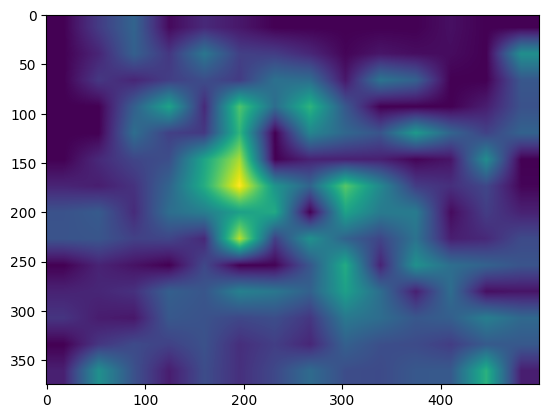

In [34]:
# 이미지에 CAM 함수 적용하기(conv4_block2_out 적용)
cam_image_conv4_block2_out = generate_grad_cam(cam_model, 'conv4_block2_out', item)
plt.imshow(cam_image_conv4_block2_out)
plt.show()

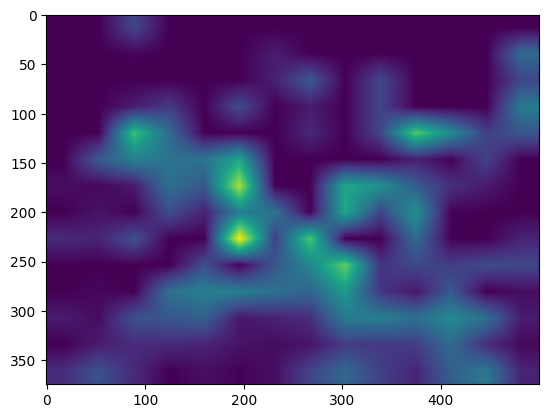

In [35]:
# 이미지에 CAM 함수 적용하기(conv4_block3_out 적용)
cam_image_conv4_block3_out = generate_grad_cam(cam_model, 'conv4_block3_out', item)
plt.imshow(cam_image_conv4_block3_out)
plt.show()

* conv3_out 레이어

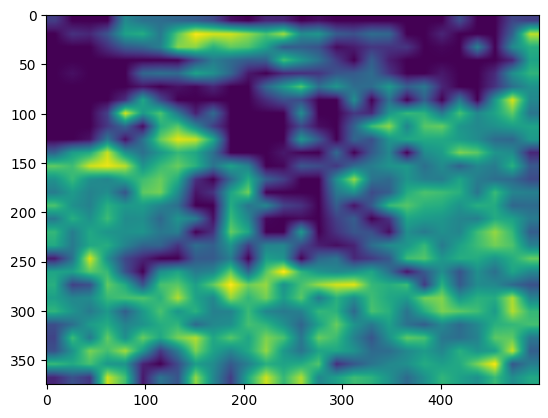

In [36]:
# 이미지에 CAM 함수 적용하기(conv3_block1_out 적용)
cam_image_conv3_block1_out = generate_grad_cam(cam_model, 'conv3_block1_out', item)
plt.imshow(cam_image_conv3_block1_out)
plt.show()

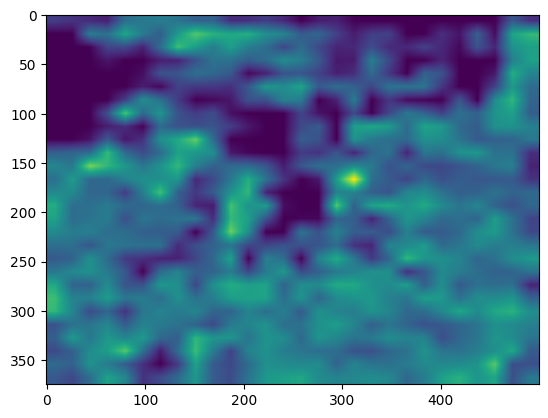

In [37]:
# 이미지에 CAM 함수 적용하기(conv3_block2_out 적용)
cam_image_conv3_block2_out = generate_grad_cam(cam_model, 'conv3_block2_out', item)
plt.imshow(cam_image_conv3_block2_out)
plt.show()

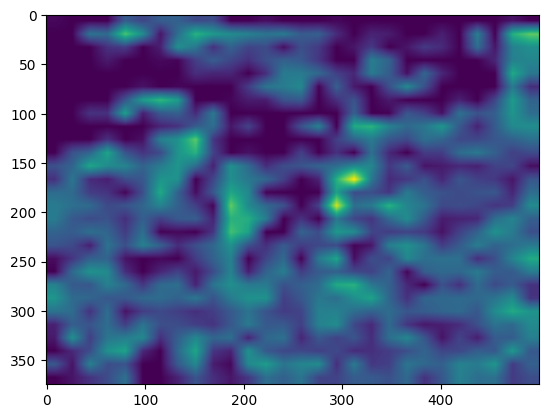

In [38]:
# 이미지에 CAM 함수 적용하기(conv3_block3_out 적용)
cam_image_conv3_block3_out = generate_grad_cam(cam_model, 'conv3_block3_out', item)
plt.imshow(cam_image_conv3_block3_out)
plt.show()

* conv2_out 레이어

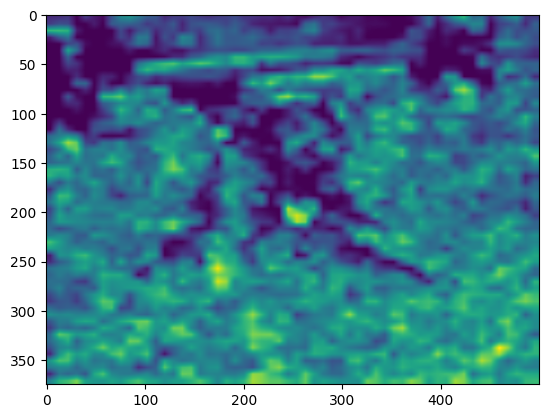

In [39]:
# 이미지에 CAM 함수 적용하기(conv2_block1_out 적용)
cam_image_conv2_block1_out = generate_grad_cam(cam_model, 'conv2_block1_out', item)
plt.imshow(cam_image_conv2_block1_out)
plt.show()

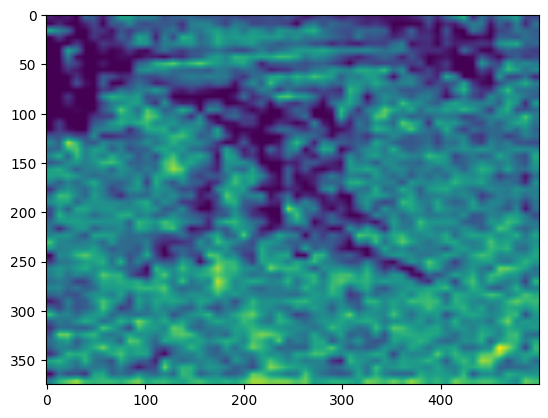

In [40]:
# 이미지에 CAM 함수 적용하기(conv2_block2_out 적용)
cam_image_conv2_block2_out = generate_grad_cam(cam_model, 'conv2_block2_out', item)
plt.imshow(cam_image_conv2_block2_out)
plt.show()

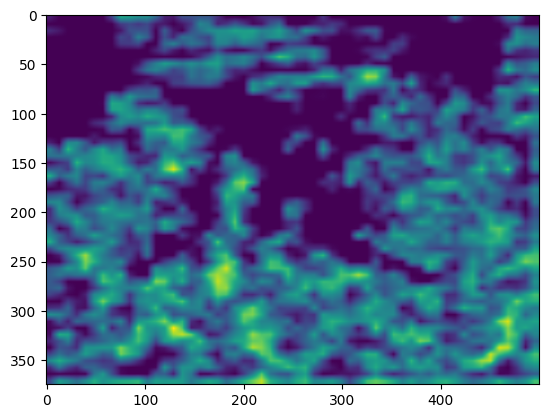

In [41]:
# 이미지에 CAM 함수 적용하기(conv2_block3_out 적용)
cam_image_conv2_block3_out = generate_grad_cam(cam_model, 'conv2_block3_out', item)
plt.imshow(cam_image_conv2_block3_out)
plt.show()

* conv5_1_relu 레이어

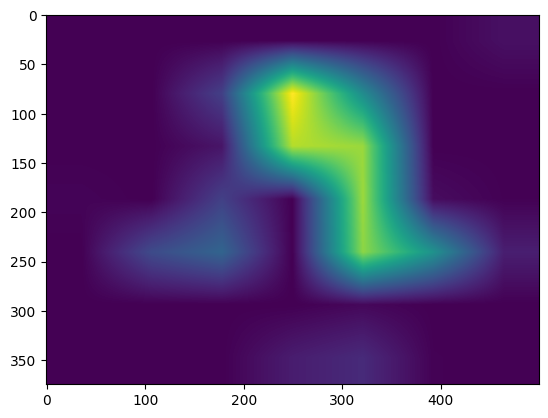

In [42]:
# 이미지에 CAM 함수 적용하기(conv5_block1_1_relu 적용)
cam_image_conv5_block1_1_relu = generate_grad_cam(cam_model, 'conv5_block1_1_relu', item)
plt.imshow(cam_image_conv5_block1_1_relu)
plt.show()

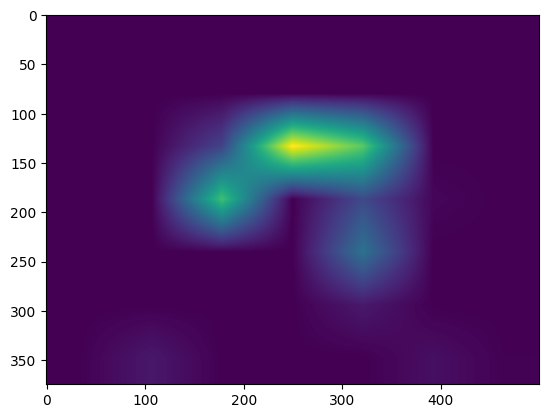

In [43]:
# 이미지에 CAM 함수 적용하기(conv5_block2_1_relu 적용)
cam_image_conv5_block2_1_relu = generate_grad_cam(cam_model, 'conv5_block2_1_relu', item)
plt.imshow(cam_image_conv5_block2_1_relu)
plt.show()

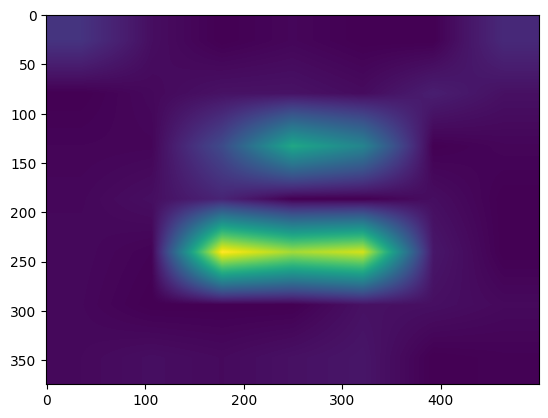

In [44]:
# 이미지에 CAM 함수 적용하기(conv5_block3_1_relu 적용)
cam_image_conv5_block3_1_relu = generate_grad_cam(cam_model, 'conv5_block3_1_relu', item)
plt.imshow(cam_image_conv5_block3_1_relu)
plt.show()

* conv5_1_conv 레이어

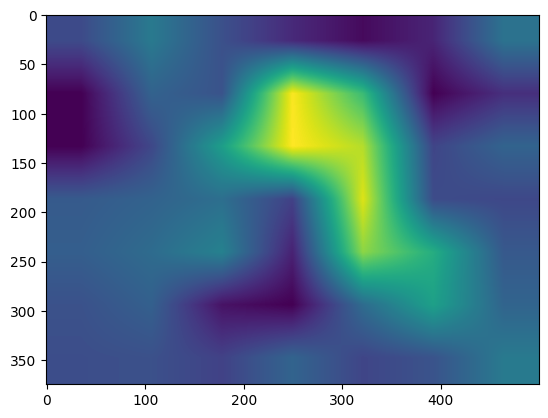

In [45]:
# 이미지에 CAM 함수 적용하기(conv5_block1_1_conv 적용)
cam_image_conv5_block1_1_conv = generate_grad_cam(cam_model, 'conv5_block1_1_conv', item)
plt.imshow(cam_image_conv5_block1_1_conv)
plt.show()

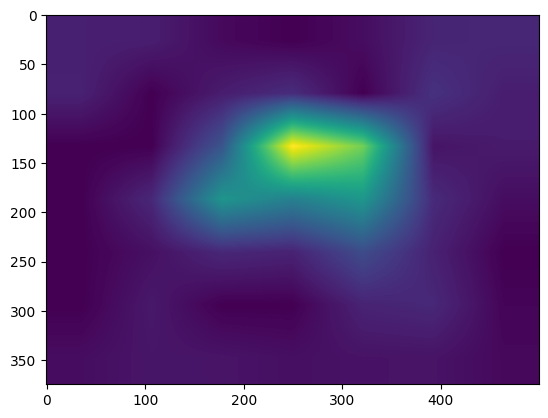

In [46]:
# 이미지에 CAM 함수 적용하기(conv5_block2_1_conv 적용)
cam_image_conv5_block2_1_conv = generate_grad_cam(cam_model, 'conv5_block2_1_conv', item)
plt.imshow(cam_image_conv5_block2_1_conv)
plt.show()

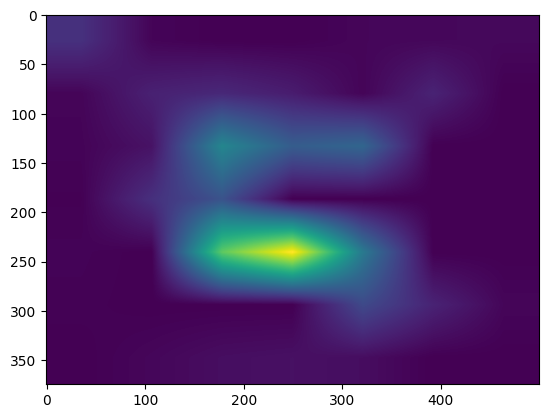

In [47]:
# 이미지에 CAM 함수 적용하기(conv5_block3_1_conv 적용)
cam_image_conv5_block3_1_conv = generate_grad_cam(cam_model, 'conv5_block3_1_conv', item)
plt.imshow(cam_image_conv5_block3_1_conv)
plt.show()

* conv5_1_bn 레이어

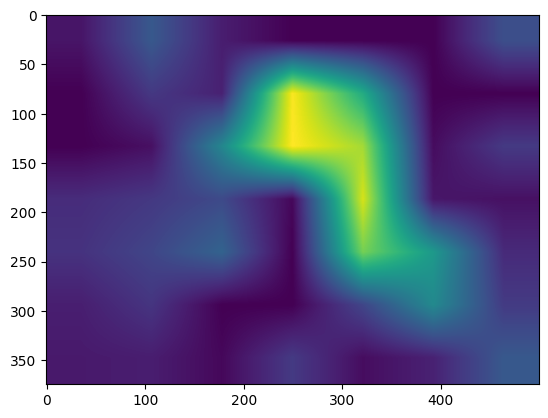

In [48]:
# 이미지에 CAM 함수 적용하기(conv5_block1_1_bn 적용)
cam_image_conv5_block1_1_bn = generate_grad_cam(cam_model, 'conv5_block1_1_bn', item)
plt.imshow(cam_image_conv5_block1_1_bn)
plt.show()

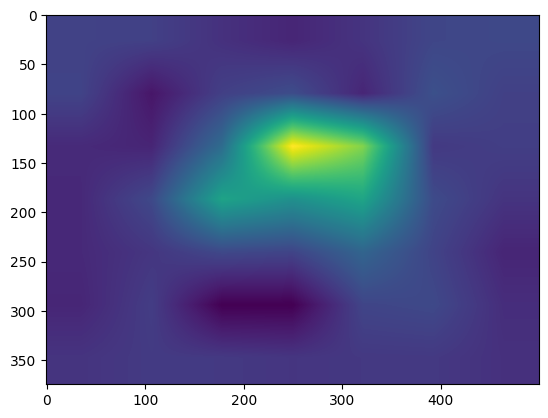

In [49]:
# 이미지에 CAM 함수 적용하기(conv5_block2_1_bn 적용)
cam_image_conv5_block2_1_bn = generate_grad_cam(cam_model, 'conv5_block2_1_bn', item)
plt.imshow(cam_image_conv5_block2_1_bn)
plt.show()

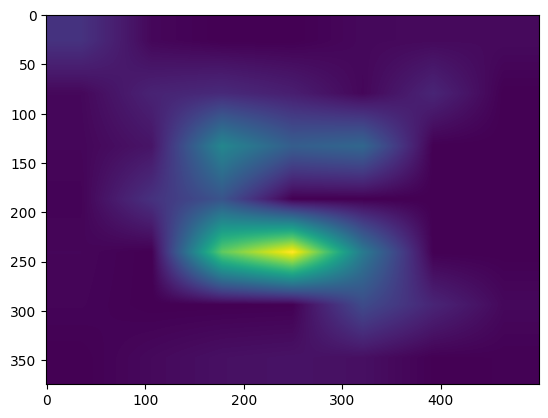

In [50]:
# 이미지에 CAM 함수 적용하기(conv5_block3_1_bn 적용)
cam_image_conv5_block3_1_bn = generate_grad_cam(cam_model, 'conv5_block3_1_bn', item)
plt.imshow(cam_image_conv5_block3_1_bn)
plt.show()

3. 위에서 만든 이미지를 `visual_cam_on_image()` 함수로 이미지를 시각화해 봅시다.

In [51]:
# 원본 이미지
origin_image = item['image'].astype(np.uint8)

* conv5_out 레이어

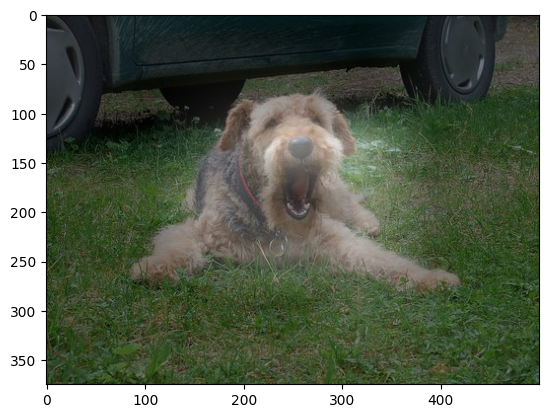

In [52]:
# conv5_block1_out
grad_cam_image_channel_conv5_block1_out = np.stack([cam_image_conv5_block1_out*255]*3, axis=-1).astype(np.uint8)
blended_grad_image_conv5_block1_out = visualize_cam_on_image(grad_cam_image_channel_conv5_block1_out, origin_image)
plt.imshow(blended_grad_image_conv5_block1_out)

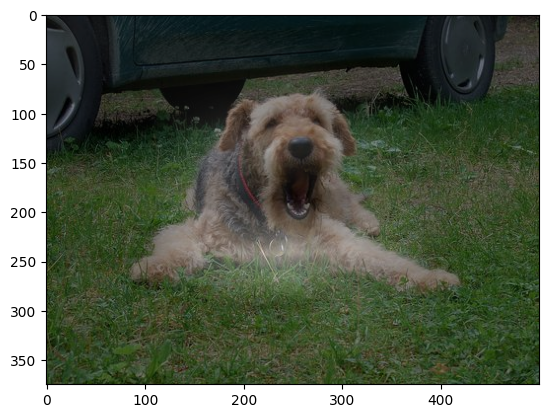

In [53]:
# conv5_block2_out
grad_cam_image_channel_conv5_block2_out = np.stack([cam_image_conv5_block2_out*255]*3, axis=-1).astype(np.uint8)
blended_grad_image_conv5_block2_out = visualize_cam_on_image(grad_cam_image_channel_conv5_block2_out, origin_image)
plt.imshow(blended_grad_image_conv5_block2_out)

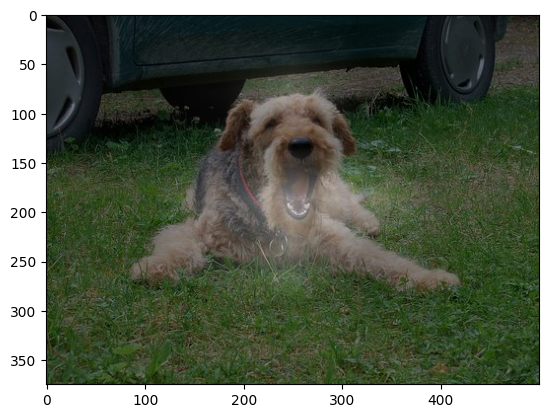

In [54]:
# conv5_block3_out
grad_cam_image_channel_conv5_block3_out = np.stack([cam_image_conv5_block3_out*255]*3, axis=-1).astype(np.uint8)
blended_grad_image_conv5_block3_out = visualize_cam_on_image(grad_cam_image_channel_conv5_block3_out, origin_image)
plt.imshow(blended_grad_image_conv5_block3_out)

* conv4_out 레이어

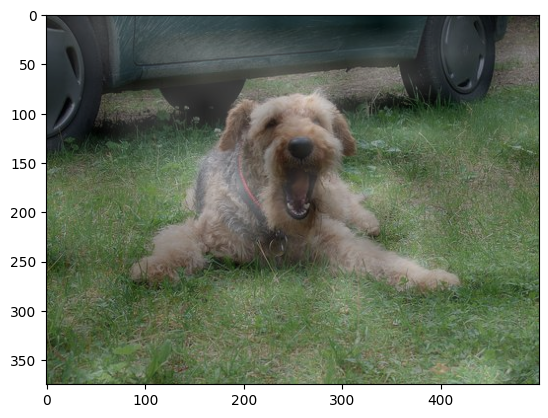

In [55]:
# conv4_block1_out
grad_cam_image_channel_conv4_block1_out = np.stack([cam_image_conv4_block1_out*255]*3, axis=-1).astype(np.uint8)
blended_grad_image_conv4_block1_out = visualize_cam_on_image(grad_cam_image_channel_conv4_block1_out, origin_image)
plt.imshow(blended_grad_image_conv4_block1_out)

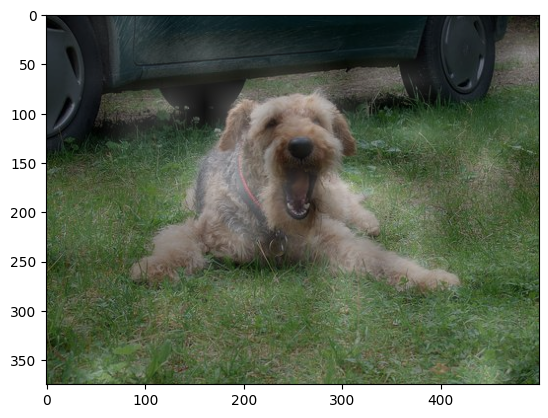

In [56]:
# conv4_block2_out
grad_cam_image_channel_conv4_block2_out = np.stack([cam_image_conv4_block2_out*255]*3, axis=-1).astype(np.uint8)
blended_grad_image_conv4_block2_out = visualize_cam_on_image(grad_cam_image_channel_conv4_block2_out, origin_image)
plt.imshow(blended_grad_image_conv4_block2_out)

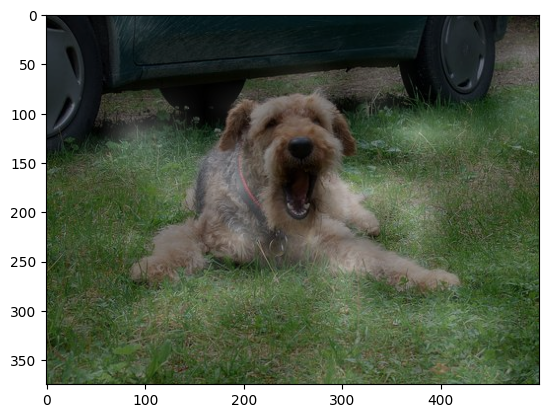

In [57]:
# conv4_block3_out
grad_cam_image_channel_conv4_block3_out = np.stack([cam_image_conv4_block3_out*255]*3, axis=-1).astype(np.uint8)
blended_grad_image_conv4_block3_out = visualize_cam_on_image(grad_cam_image_channel_conv4_block3_out, origin_image)
plt.imshow(blended_grad_image_conv4_block3_out)

* conv3_out 레이어

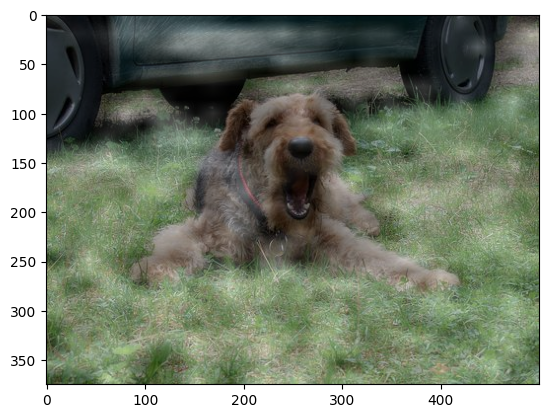

In [58]:
# conv3_block1_out
grad_cam_image_channel_conv3_block1_out = np.stack([cam_image_conv3_block1_out*255]*3, axis=-1).astype(np.uint8)
blended_grad_image_conv3_block1_out = visualize_cam_on_image(grad_cam_image_channel_conv3_block1_out, origin_image)
plt.imshow(blended_grad_image_conv3_block1_out)

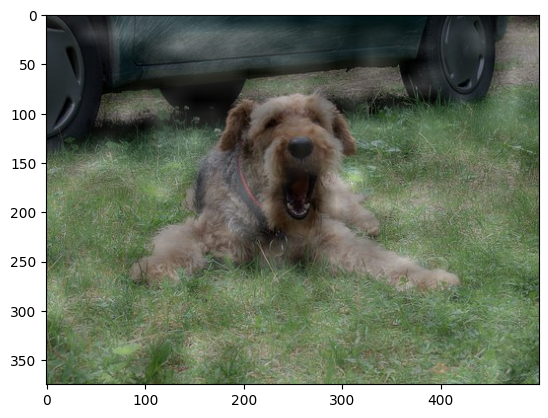

In [59]:
# conv3_block2_out
grad_cam_image_channel_conv3_block2_out = np.stack([cam_image_conv3_block2_out*255]*3, axis=-1).astype(np.uint8)
blended_grad_image_conv3_block2_out = visualize_cam_on_image(grad_cam_image_channel_conv3_block2_out, origin_image)
plt.imshow(blended_grad_image_conv3_block2_out)

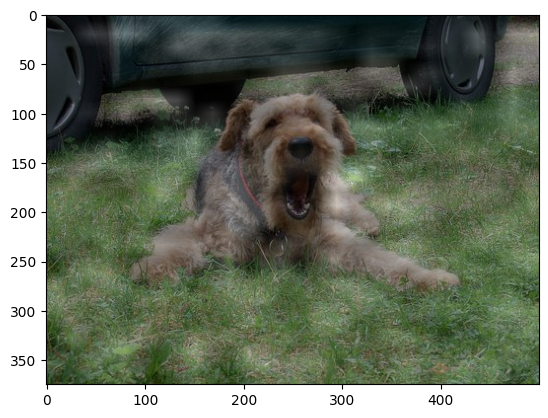

In [60]:
# conv3_block3_out
grad_cam_image_channel_conv3_block3_out = np.stack([cam_image_conv3_block3_out*255]*3, axis=-1).astype(np.uint8)
blended_grad_image_conv3_block3_out = visualize_cam_on_image(grad_cam_image_channel_conv3_block3_out, origin_image)
plt.imshow(blended_grad_image_conv3_block3_out)

* conv2_out 레이어

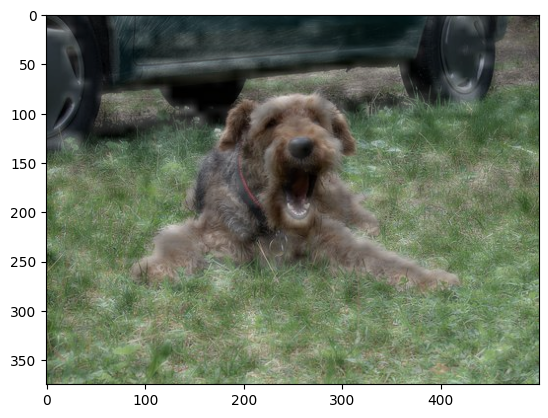

In [61]:
# conv2_block1_out
grad_cam_image_channel_conv2_block1_out = np.stack([cam_image_conv2_block1_out*255]*3, axis=-1).astype(np.uint8)
blended_grad_image_conv2_block1_out = visualize_cam_on_image(grad_cam_image_channel_conv2_block1_out, origin_image)
plt.imshow(blended_grad_image_conv2_block1_out)

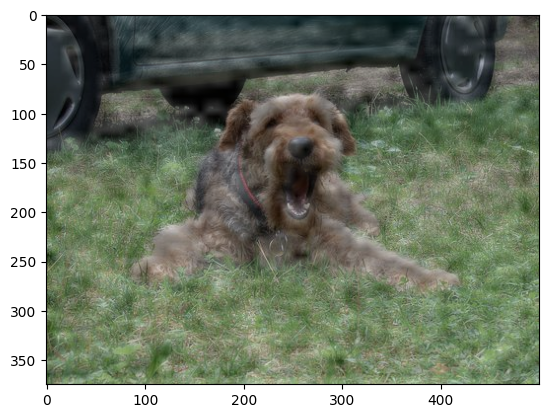

In [62]:
# conv2_block2_out
grad_cam_image_channel_conv2_block2_out = np.stack([cam_image_conv2_block2_out*255]*3, axis=-1).astype(np.uint8)
blended_grad_image_conv2_block2_out = visualize_cam_on_image(grad_cam_image_channel_conv2_block2_out, origin_image)
plt.imshow(blended_grad_image_conv2_block2_out)

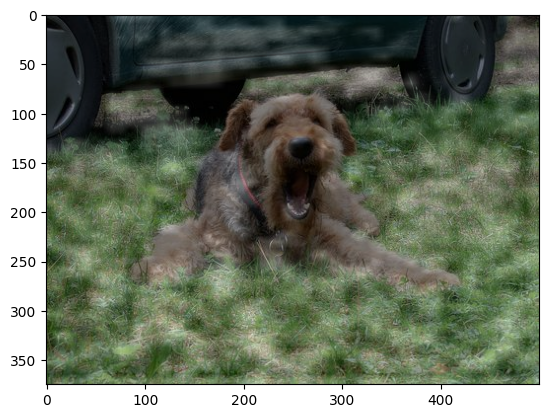

In [63]:
# conv2_block3_out
grad_cam_image_channel_conv2_block3_out = np.stack([cam_image_conv2_block3_out*255]*3, axis=-1).astype(np.uint8)
blended_grad_image_conv2_block3_out = visualize_cam_on_image(grad_cam_image_channel_conv2_block3_out, origin_image)
plt.imshow(blended_grad_image_conv2_block3_out)

### **바운딩 박스 구하기**

1. 직접 Grad-CAM으로 얻은 CAM을 통해서 바운딩 박스를 얻어봅시다.

In [64]:
# bounding box에서 꼭지점으로 바꾸어주는 함수 만들기
def get_bbox(cam_image, score_thresh=0.05):
    # score_thresh를 받아 역치값 이하의 바운딩 박스는 없애기
    low_indicies = cam_image <= score_thresh
    cam_image[low_indicies] = 0
    cam_image = (cam_image*255).astype(np.uint8)

    # OpenCV의 findContours()와 minAreaRect()로 사각형을 찾기
    contours,_ = cv2.findContours(cam_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    cnt = contours[0]
    # rotated_rect라는 회전된 바운딩 박스를 얻을 수 있음.
    rotated_rect = cv2.minAreaRect(cnt)
    # 이를 꼭지점으로 바꾸어주어야 함
    rect = cv2.boxPoints(rotated_rect)
    # int 자료형으로 변환하기
    rect = np.int0(rect)
    return rect

2. 바운딩 박스를 시각해봅시다.

이미지와 bounding box를 적용하여 보여주기

* conv5_out 레이어

<ipython-input-64-a7b73fc82556>:16: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  rect = np.int0(rect)


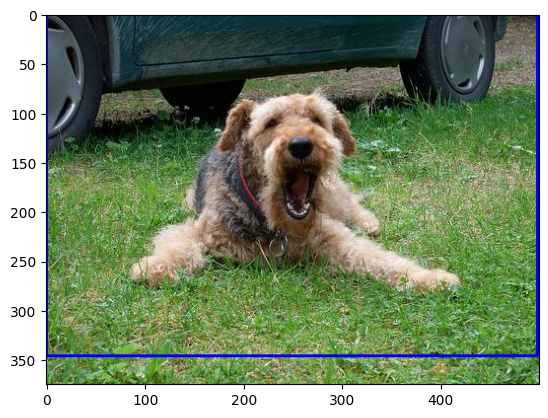

In [65]:
# conv5_block1_out
rect_conv5_block1_out = get_bbox(cam_image_conv5_block1_out)
image_conv5_block1_out = copy.deepcopy(item['image'])
image_conv5_block1_out = cv2.drawContours(image_conv5_block1_out, [rect_conv5_block1_out], 0, (0,0,255), 2)
plt.imshow(image_conv5_block1_out)
plt.show()

<ipython-input-64-a7b73fc82556>:16: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  rect = np.int0(rect)


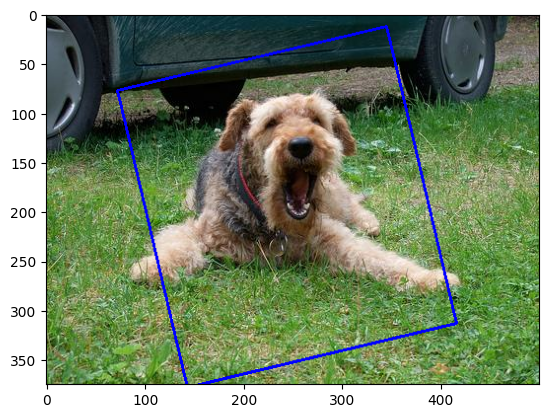

In [66]:
# conv5_block2_out
rect_conv5_block2_out = get_bbox(cam_image_conv5_block2_out)
image_conv5_block2_out = copy.deepcopy(item['image'])
image_conv5_block2_out = cv2.drawContours(image_conv5_block2_out, [rect_conv5_block2_out], 0, (0,0,255), 2)
plt.imshow(image_conv5_block2_out)
plt.show()

<ipython-input-64-a7b73fc82556>:16: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  rect = np.int0(rect)


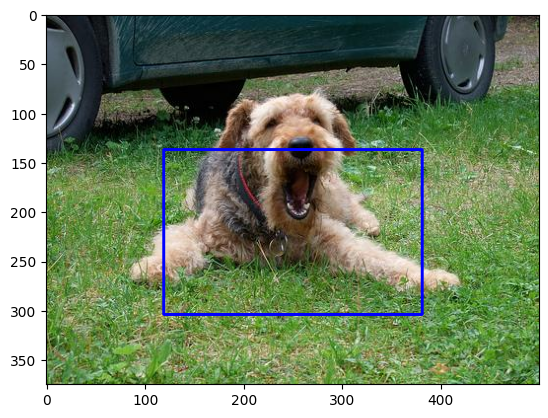

In [67]:
# conv5_block3_out
rect_conv5_block3_out = get_bbox(cam_image_conv5_block3_out)
image_conv5_block3_out = copy.deepcopy(item['image'])
imag_conv5_block3_out = cv2.drawContours(image_conv5_block3_out, [rect_conv5_block3_out], 0, (0,0,255), 2)
plt.imshow(image_conv5_block3_out)
plt.show()

* conv4_out 레이어

<ipython-input-64-a7b73fc82556>:16: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  rect = np.int0(rect)


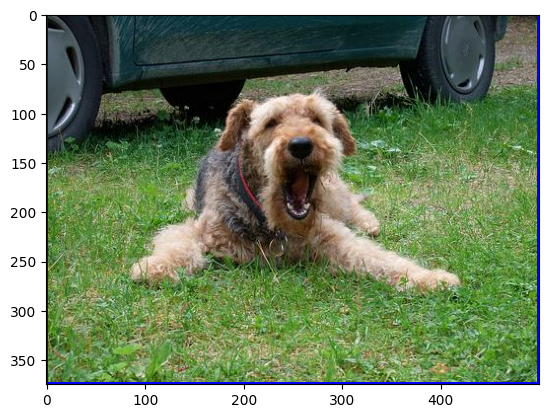

In [68]:
# conv4_block1_out
rect_conv4_block1_out = get_bbox(cam_image_conv4_block1_out)
image_conv4_block1_out = copy.deepcopy(item['image'])
image_conv4_block1_out = cv2.drawContours(image_conv4_block1_out, [rect_conv4_block1_out], 0, (0,0,255), 2)
plt.imshow(image_conv4_block1_out)
plt.show()

<ipython-input-64-a7b73fc82556>:16: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  rect = np.int0(rect)


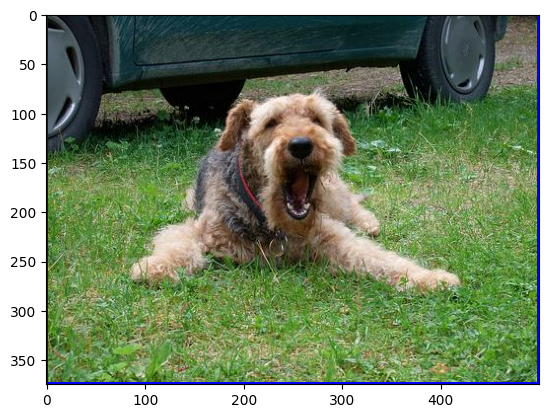

In [69]:
# conv4_block2_out
rect_conv4_block2_out = get_bbox(cam_image_conv4_block2_out)
image_conv4_block2_out = copy.deepcopy(item['image'])
image_conv4_block2_out = cv2.drawContours(image_conv4_block2_out, [rect_conv4_block2_out], 0, (0,0,255), 2)
plt.imshow(image_conv4_block2_out)
plt.show()

<ipython-input-64-a7b73fc82556>:16: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  rect = np.int0(rect)


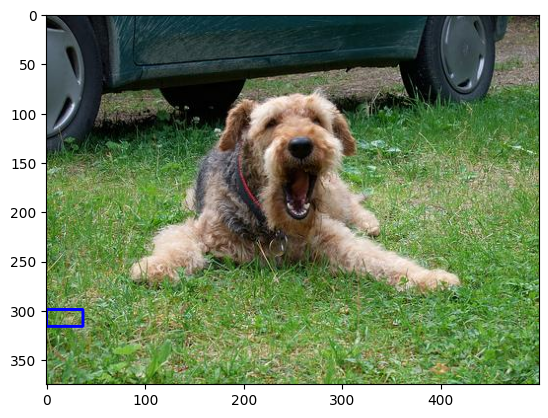

In [70]:
# conv4_block3_out
rect_conv4_block3_out = get_bbox(cam_image_conv4_block3_out)
image_conv4_block3_out = copy.deepcopy(item['image'])
image_conv4_block3_out = cv2.drawContours(image_conv4_block3_out, [rect_conv4_block3_out], 0, (0,0,255), 2)
plt.imshow(image_conv4_block3_out)
plt.show()

* conv3_out 레이어

<ipython-input-64-a7b73fc82556>:16: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  rect = np.int0(rect)


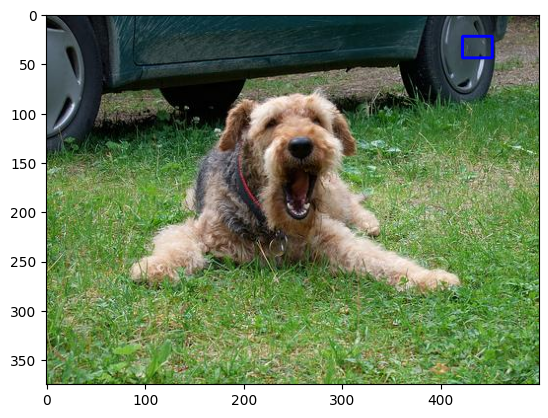

In [71]:
# conv3_block1_out
rect_conv3_block1_out = get_bbox(cam_image_conv3_block1_out)
image_conv3_block1_out = copy.deepcopy(item['image'])
imag_conv3_block1_out = cv2.drawContours(image_conv3_block1_out, [rect_conv3_block1_out], 0, (0,0,255), 2)
plt.imshow(image_conv3_block1_out)
plt.show()

<ipython-input-64-a7b73fc82556>:16: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  rect = np.int0(rect)


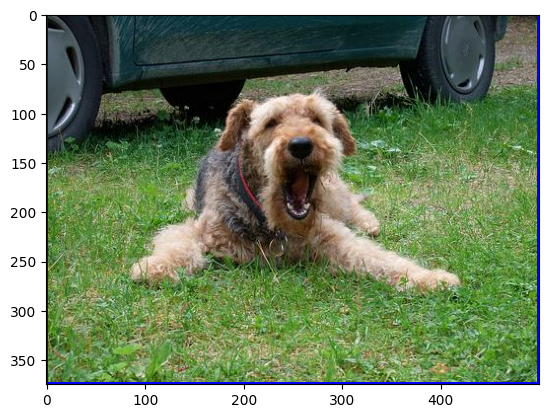

In [72]:
# conv3_block2_out
rect_conv3_block2_out = get_bbox(cam_image_conv3_block2_out)
image_conv3_block2_out = copy.deepcopy(item['image'])
image_conv3_block2_out = cv2.drawContours(image_conv3_block2_out, [rect_conv3_block2_out], 0, (0,0,255), 2)
plt.imshow(image_conv3_block2_out)
plt.show()

<ipython-input-64-a7b73fc82556>:16: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  rect = np.int0(rect)


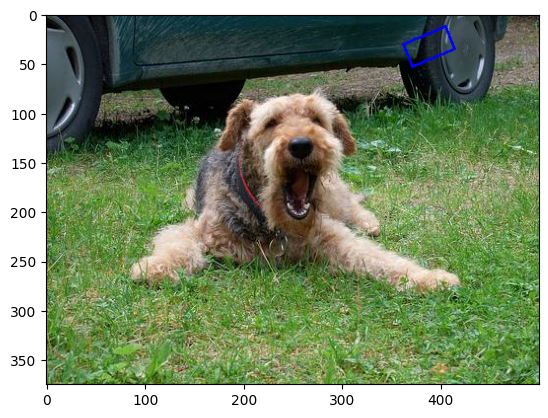

In [73]:
# conv3_block3_out
rect_conv3_block3_out = get_bbox(cam_image_conv3_block3_out)
image_conv3_block3_out = copy.deepcopy(item['image'])
image_conv3_block3_out = cv2.drawContours(image_conv3_block3_out, [rect_conv3_block3_out], 0, (0,0,255), 2)
plt.imshow(image_conv3_block3_out)
plt.show()

* conv2_out 레이어

<ipython-input-64-a7b73fc82556>:16: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  rect = np.int0(rect)


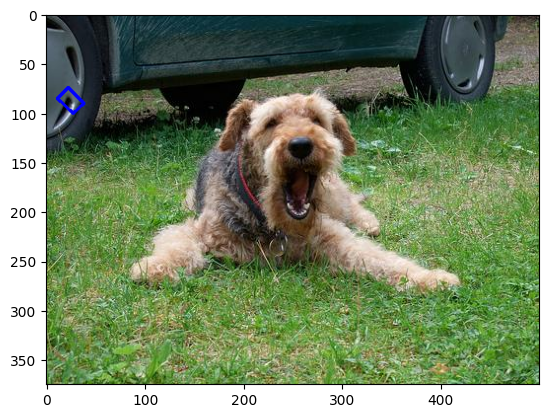

In [74]:
# conv2_block1_out
rect_conv2_block1_out = get_bbox(cam_image_conv2_block1_out)
image_conv2_block1_out = copy.deepcopy(item['image'])
image_conv2_block1_out = cv2.drawContours(image_conv2_block1_out, [rect_conv2_block1_out], 0, (0,0,255), 2)
plt.imshow(image_conv2_block1_out)
plt.show()

<ipython-input-64-a7b73fc82556>:16: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  rect = np.int0(rect)


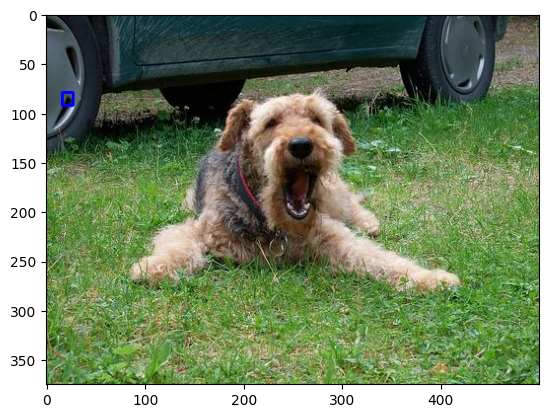

In [75]:
# conv2_block2_out
rect_conv2_block2_out = get_bbox(cam_image_conv2_block2_out)
image_conv2_block2_out = copy.deepcopy(item['image'])
image_conv2_block2_out = cv2.drawContours(image_conv2_block2_out, [rect_conv2_block2_out], 0, (0,0,255), 2)
plt.imshow(image_conv2_block2_out)
plt.show()

<ipython-input-64-a7b73fc82556>:16: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  rect = np.int0(rect)


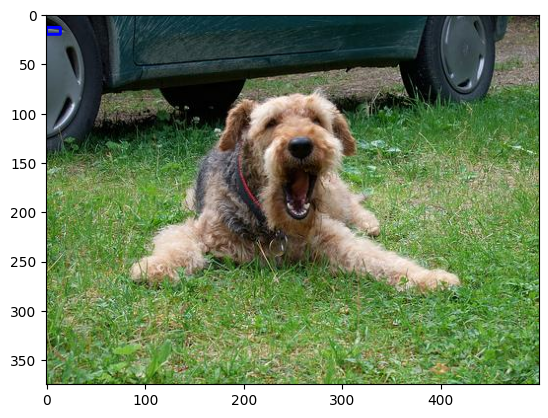

In [76]:
# conv2_block3_out
rect_conv2_block3_out = get_bbox(cam_image_conv2_block3_out)
image_conv2_block3_out = copy.deepcopy(item['image'])
image_conv2_block3_out = cv2.drawContours(image_conv2_block3_out, [rect_conv2_block3_out], 0, (0,0,255), 2)
plt.imshow(image_conv2_block3_out)
plt.show()

### **IoU 구하기**

1. **정답 바운딩 박스(ground truth)** 와 **예측값 바운딩 박스(prediction box)** 두 가지를 이용해서 IoU를 계산하는 `get_iou()` 함수를 만들어 주세요.

In [77]:
# rect의 좌표는 (x, y) 형태로, bbox는 (y_min, x_min, y_max, x_max)의 normalized 형태로 주어집니다.
def rect_to_minmax(rect, image):
    bbox = [
        rect[:,1].min()/float(image.shape[0]),  #bounding box의 y_min
        rect[:,0].min()/float(image.shape[1]),  #bounding box의 x_min
        rect[:,1].max()/float(image.shape[0]), #bounding box의 y_max
        rect[:,0].max()/float(image.shape[1]) #bounding box의 x_max
    ]
    return bbox

In [78]:
# CAM 추론 결과로 얻어진 bbox가 유사한지 IoU로 계산하기
def get_iou(boxA, boxB):
    y_min = max(boxA[0], boxB[0])
    x_min= max(boxA[1], boxB[1])
    y_max = min(boxA[2], boxB[2])
    x_max = min(boxA[3], boxB[3])

    interArea = max(0, x_max - x_min) * max(0, y_max - y_min)
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])
    iou = interArea / float(boxAArea + boxBArea - interArea)

    return iou

* 정답 바운딩 박스 확인하기

In [79]:
# 정답 바운딩 박스 확인하기
item['objects']['bbox']

array([[0.192, 0.168, 0.76 , 0.838]], dtype=float32)

2. CAM과 Grad-CAM으로 얻은 바운딩 박스와 정답 바운딩 박스와의 IoU를 각각 비교해 봅시다.

* conv5_out 레이어

* 예측값 바운딩 박스 확인하기

In [80]:
# conv5_block1_out
pred_bbox_conv5_block1_out = rect_to_minmax(rect_conv5_block1_out, item['image'])
print(pred_bbox_conv5_block1_out)
iou_conv5_block1_out = get_iou(pred_bbox_conv5_block1_out, item['objects']['bbox'][0])
print(iou_conv5_block1_out)

[0.0, 0.0, 0.9226666666666666, 0.996]
0.4141130789806189


In [81]:
# conv5_block2_out
pred_bbox_conv5_block2_out = rect_to_minmax(rect_conv5_block2_out, item['image'])
print(pred_bbox_conv5_block2_out)
iou_conv5_block2_out = get_iou(pred_bbox_conv5_block2_out, item['objects']['bbox'][0])
print(iou_conv5_block2_out)

[0.032, 0.144, 1.008, 0.832]
0.5588297608081773


In [82]:
# conv5_block3_out
pred_bbox_conv5_block3_out = rect_to_minmax(rect_conv5_block3_out, item['image'])
print(pred_bbox_conv5_block3_out)
iou_conv5_block3_out = get_iou(pred_bbox_conv5_block3_out, item['objects']['bbox'][0])
print(iou_conv5_block3_out)

[0.36533333333333334, 0.238, 0.8106666666666666, 0.762]
0.5079847563856527


* conv4_out 레이어

In [83]:
# conv4_block1_out
pred_bbox_conv4_block1_out = rect_to_minmax(rect_conv4_block1_out, item['image'])
print(pred_bbox_conv4_block1_out)
iou_conv4_block1_out = get_iou(pred_bbox_conv4_block1_out, item['objects']['bbox'][0])
print(iou_conv4_block1_out)

[0.0, 0.0, 0.9973333333333333, 0.998]
0.382342205335765


In [84]:
# conv4_block2_out
pred_bbox_conv4_block2_out = rect_to_minmax(rect_conv4_block2_out, item['image'])
print(pred_bbox_conv4_block2_out)
iou_conv4_block2_out = get_iou(pred_bbox_conv4_block2_out, item['objects']['bbox'][0])
print(iou_conv4_block2_out)

[0.0, 0.0, 0.9973333333333333, 0.998]
0.382342205335765


In [85]:
# conv4_block3_out
pred_bbox_conv4_block3_out = rect_to_minmax(rect_conv4_block3_out, item['image'])
print(pred_bbox_conv4_block3_out)
iou_conv4_block3_out = get_iou(pred_bbox_conv4_block3_out, item['objects']['bbox'][0])
print(iou_conv4_block3_out)

[0.7973333333333333, 0.0, 0.8426666666666667, 0.074]
0.0


* conv3_out 레이어

In [86]:
# conv3_block1_out
pred_bbox_conv3_block1_out = rect_to_minmax(rect_conv3_block1_out, item['image'])
print(pred_bbox_conv3_block1_out)
iou_conv3_block1_out = get_iou(pred_bbox_conv3_block1_out, item['objects']['bbox'][0])
print(iou_conv3_block1_out)

[0.058666666666666666, 0.844, 0.11733333333333333, 0.904]
0.0


In [87]:
# conv3_block2_out
pred_bbox_conv3_block2_out = rect_to_minmax(rect_conv3_block2_out, item['image'])
print(pred_bbox_conv3_block2_out)
iou_conv3_block2_out = get_iou(pred_bbox_conv3_block2_out, item['objects']['bbox'][0])
print(iou_conv3_block2_out)

[0.0, 0.0, 0.9973333333333333, 0.998]
0.382342205335765


In [88]:
# conv3_block3_out
pred_bbox_conv3_block3_out = rect_to_minmax(rect_conv3_block3_out, item['image'])
print(pred_bbox_conv3_block3_out)
iou_conv3_block3_out = get_iou(pred_bbox_conv3_block3_out, item['objects']['bbox'][0])
print(iou_conv3_block3_out)

[0.032, 0.724, 0.14133333333333334, 0.828]
0.0


* conv2_out 레이어

In [89]:
# conv2_block1_out
pred_bbox_conv2_block1_out = rect_to_minmax(rect_conv2_block1_out, item['image'])
print(pred_bbox_conv2_block1_out)
iou_conv2_block1_out = get_iou(pred_bbox_conv2_block1_out, item['objects']['bbox'][0])
print(iou_conv2_block1_out)

[0.19733333333333333, 0.022, 0.26666666666666666, 0.076]
0.0


In [90]:
# conv2_block2_out
pred_bbox_conv2_block2_out = rect_to_minmax(rect_conv2_block2_out, item['image'])
print(pred_bbox_conv2_block2_out)
iou_conv2_block2_out = get_iou(pred_bbox_conv2_block2_out, item['objects']['bbox'][0])
print(iou_conv2_block2_out)

[0.21066666666666667, 0.032, 0.24533333333333332, 0.054]
0.0


In [91]:
# conv2_block3_out
pred_bbox_conv2_block3_out = rect_to_minmax(rect_conv2_block3_out, item['image'])
print(pred_bbox_conv2_block3_out)
iou_conv2_block3_out = get_iou(pred_bbox_conv2_block3_out, item['objects']['bbox'][0])
print(iou_conv2_block3_out)

[0.034666666666666665, 0.0, 0.05333333333333334, 0.028]
0.0


* 데이터프레임으로 출력하기

In [92]:
# 데이터프레임 형태로 저장하기
data = {'conv2': [iou_conv2_block1_out, iou_conv2_block2_out, iou_conv2_block3_out],
        'conv3': [iou_conv3_block1_out, iou_conv3_block2_out, iou_conv3_block3_out],
        'conv4': [iou_conv4_block1_out, iou_conv4_block2_out, iou_conv4_block3_out],
        'conv5': [iou_conv5_block1_out, iou_conv5_block2_out, iou_conv5_block3_out]}

In [94]:
# 데이터프레임 출력하기
df = pd.DataFrame(data, index=['block1', 'block2', 'block3'])
df

,conv2,conv3,conv4,conv5
block1,0.0,0.000000,0.382342,0.414113
block2,0.0,0.382342,0.382342,0.558830
block3,0.0,0.000000,0.000000,0.507985


## **2. 회고하기**

**[ 배운 점 & 느낀 점 ]** CAM 모델과 Grad-CAM 모델을 통해 딥러닝 모델이 어떤 것을 볼 수 있는지 알 수 있었다. conv가 높을수록 구조적인 측면, 즉, 전체적으로 사진을 본다는 것을 할 수 있고, conv가 낮을수록 낮은 패턴을 볼 수 있다는 것을 알 수 있다.

**[ 어려웠던 점 & 아쉬운 점 ]** bounding box를 만들 때, 실제 bounding box와 예측 bounding box 간의 오차가 굉장히 커서 아쉬웠다. 조금 더 나은 예측률을 위해 여러 수치를 바꾸었지만, 쉽지는 않았다.